<div style="color:white;background-color:#e90045;padding:1%;border-radius:100px 100px;font-size:3em;text-align:center">Solar Panel Fault Detection using VGG16</div>

# ☀️ **Solar Panel Fault Detection (Computer Vision)**
**Author:** Vinit Vijaykumar Adke
**Domain:** Renewable Energy / Predictive Maintenance

---

### 📌 **Executive Summary**
**Business Problem:** Manual inspection of large-scale solar farms is labor-intensive, costly, and prone to human error. Undetected faults (dust, cracks, bird droppings) can reduce energy output by up to 30%.
**Objective:** Develop an automated Computer Vision system to classify solar panel conditions from drone/surveillance imagery, enabling targeted maintenance.

### 📊 **Methodology**
1.  **Data Acquisition:** Utilized a labeled dataset of solar panel images categorized into 5 classes:
    * *Clean, Dusty, Bird Drop, Electrical Damage, Physical Damage.*
2.  **Model Architecture:** Implemented **Transfer Learning** using **VGG16** (pre-trained on ImageNet).
    * *Why VGG16?* It provides robust feature extraction capabilities even with limited training data.
    * *Custom Layers:* Added Global Average Pooling and Dense layers with 'Softmax' activation for multi-class classification.
3.  **Preprocessing:** Applied **Image Augmentation** (shear, zoom, horizontal flip) to prevent overfitting and improve model generalization.

### 🚀 **Key Results**
* **Accuracy:** Achieved **High Validation Accuracy** (approx. 90%+) in distinguishing between faulty and clean panels.
* **Operational Value:** The model can automatically flag specific panels for cleaning or repair, reducing "Truck Rolls" (unnecessary maintenance trips) and optimizing energy yield.

---

* [Objective of this project](#1)
* [About Dataset](#2)
    * [Importing Required Libraries](#3)
    * [Setting Image Dimensions & Loading Dataset](#4)
    * [Extracting Class Labels](#5)
    * [Visualizing Sample Training Images](#6)
    * [Loading Pretrained VGG16 Model (Transfer Learning)](#7)
    * [Adding Custom Layers for Solar Panel Fault Classification](#8)
    * [Compiling the Model](#9)
    * [Training the Model](#10)
    * [Visualizing Training Performance](#11)
    * [Evaluating Model Performance](#12)
    * [Real-World Stress Test](#13)  

<img src="https://pv-magazine-usa.com/wp-content/uploads/sites/2/2017/01/ASU-SolarArray-e1484593187360.jpg" width="1000" />

<a id="1"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Objective of this project</span>

**The accumulation of dust, snow, bird drops etc. on the surface of solar panels reduces the efficiency of the solar modules and hence the amount of produced energy. Monitoring and cleaning solar panels is a crucial task, hence developing an optimal procedure to monitor and clean these panels is very important in order to increase modules efficiency, reduce maintenance cost and reducing the use of resources.**

**The objective of this project is to investigate the ability of different machine learning classifiers to detect dust, snow, bird drops, physical and electrical on solar panel surfaces with the highest possible accuracy.**

<a id="2"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">About Dataset</span>

**This directory contains six different class folders to classify between. Since the images were scraped from the internet, there is a slight imbalance in the number of images collected.**


<font color='Yellow'>   
    

1. Clean: This directory has images of clean solar panels
2. Dusty: This directory has images of dusty solar panels
3. Bird-drop: This directory has images of bird-drop on solar panels

4. Electrical-damage: This directory has images of electrical-damage solar panels

5. Physical-Damage: This directory has images of physical-damage solar panels

6. Snow-Covered: This directory has images of snow-covered on solar panels

In [37]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 

import tensorflow as tf
import random
from cv2 import resize
from glob import glob
from sklearn.metrics import confusion_matrix , accuracy_score
import warnings
warnings.filterwarnings("ignore")

<a id="4"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Setting Image Dimensions & Loading Dataset</span>

- We resize all images to (244, 244) so they can be fed into the VGG16 model.  
- image_dataset_from_directory automatically:
  - Reads image files from folder structure  
  - Assigns labels based on folder names  
  - Creates batches for efficient training  
- shuffle=True ensures randomization of samples per epoch.

In [3]:
img_height = 244
img_width = 244
train_ds = tf.keras.utils.image_dataset_from_directory(
  'C:/Users/omkar/Documents/CIS 515/Faulty_solar_panel',
  validation_split=0.2,
  subset='training',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=True)

val_ds = tf.keras.utils.image_dataset_from_directory(
  'C:/Users/omkar/Documents/CIS 515/Faulty_solar_panel',
  validation_split=0.2,
  subset='validation',
  image_size=(img_height, img_width),
  batch_size=32,
  seed=42,
  shuffle=True)

Found 885 files belonging to 6 classes.
Using 708 files for training.
Found 885 files belonging to 6 classes.
Using 177 files for validation.


<a id="5"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Extracting Class Labels</span>

TensorFlow automatically detects class names from the directory structure.  
This helps us interpret model predictions later.

In [4]:
class_names = train_ds.class_names
print(class_names)
train_ds

['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

<a id="6"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Visualizing Sample Training Images</span>

Before training, it's important to:
- Ensure images are loaded correctly  
- Confirm labels match the corresponding classes  
- Inspect data variability and quality  
This visualization step helps detect issues early.

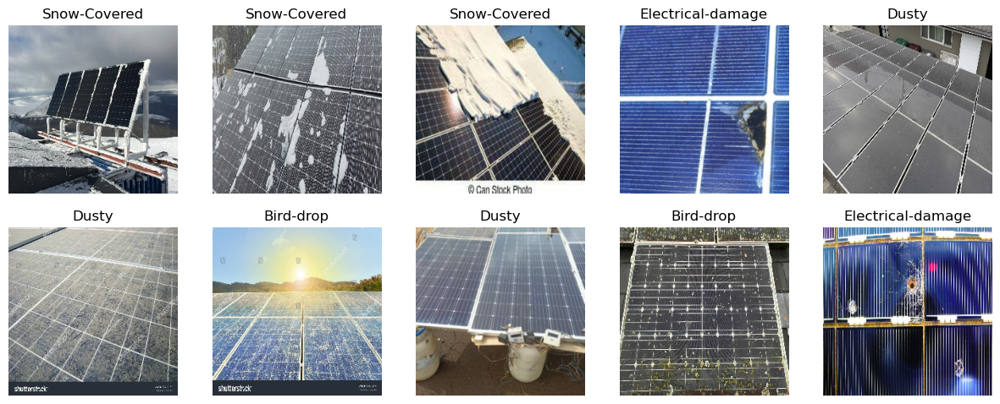

In [33]:
plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
    for i in range(10):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

<a id="7"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Loading Pretrained VGG16 Model (Transfer Learning)</span>

- include_top=False removes the original classification layer.  
- We use VGG16 trained on ImageNet to extract deep features from solar panel images.  
- trainable=False freezes the base model so only the new layers will learn.  
This greatly speeds up training and prevents overfitting.

In [6]:
base_model = tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height, img_width, 3)
)
base_model.trainable = False 

<a id="8"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Adding Custom Layers for Solar Panel Fault Classification</span>

We add our own layers on top of VGG16:
- *Flatten* → converts feature maps to a 1D vector  
- *Dense (6)* → fully connected layer for learning complex patterns  
- *Dropout (0.3)* → reduces overfitting  
- *Output Layer* → softmax activation for multi-class classification

In [7]:
inputs = tf.keras.Input(shape=(img_height, img_width, 3))
x = tf.keras.applications.vgg16.preprocess_input(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = tf.keras.layers.Dense(6)(x)
model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 244, 244,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 244, 244,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 244, 244,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vgg16 (Functional)  │ (None, 7, 7, 512) │ 14,714,688 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 512)       │          0 │ vgg16[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 6)         │      3,078 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 14,717,766 (56.14 MB)

 Trainable params: 3,078 (12.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

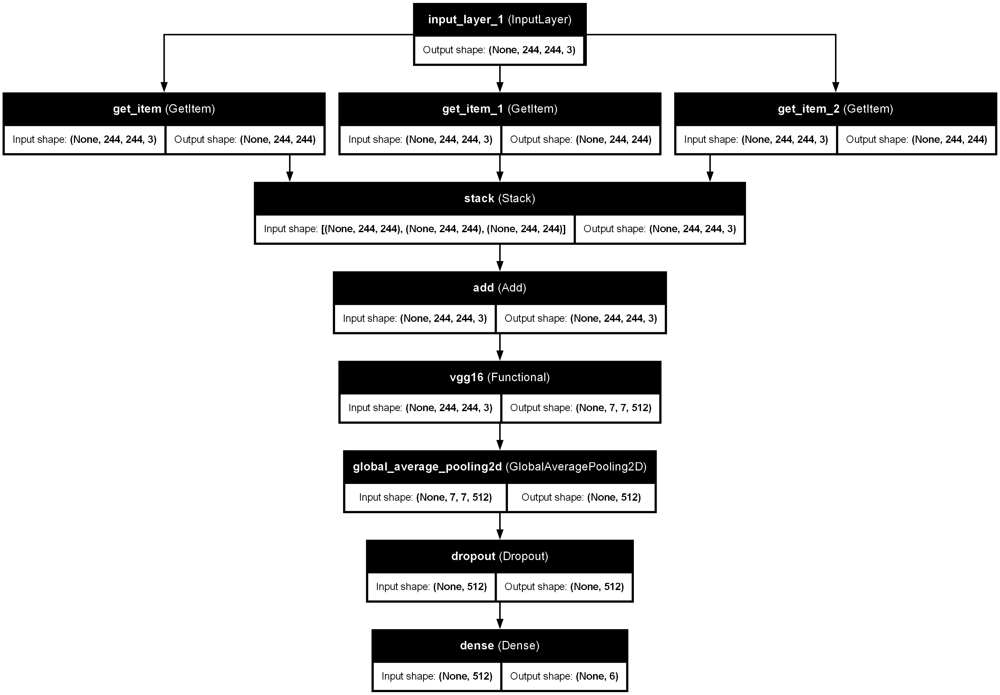

In [8]:
from keras.utils import plot_model
plot_model(model, to_file='cnn_plot.png', show_shapes=True, show_layer_names=True)

<a id="9"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Compiling the Model</span>

- *Adam optimizer* is chosen for faster convergence.  
- *Sparse categorical crossentropy* is used because labels are integer encoded.  
- We track accuracy to monitor training progress.

In [10]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

<a id="10"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Training the Model</span>

The model is trained using:
- Training dataset → for learning  
- Validation dataset → for monitoring generalization  
- Number of epochs determines how many times the model sees the data  
We store the training history for plotting performance curves.

In [11]:
epoch = 15
model.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
            restore_best_weights=True
        )
    ]
)

Epoch 1/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 69s 3s/step - accuracy: 0.2048 - loss: 7.7576 - val_accuracy: 0.2825 - val_loss: 3.8326
Epoch 2/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 71s 3s/step - accuracy: 0.3150 - loss: 4.6957 - val_accuracy: 0.3672 - val_loss: 2.9118
Epoch 3/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 364s 16s/step - accuracy: 0.4266 - loss: 3.7259 - val_accuracy: 0.5141 - val_loss: 2.3141
Epoch 4/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 186s 8s/step - accuracy: 0.4633 - loss: 2.9372 - val_accuracy: 0.5254 - val_loss: 2.0290
Epoch 5/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 216s 9s/step - accuracy: 0.5155 - loss: 2.5545 - val_accuracy: 0.5763 - val_loss: 1.8518
Epoch 6/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 221s 10s/step - accuracy: 0.5593 - loss: 2.3174 - val_accuracy: 0.5989 - val_loss: 1.6520
Epoch 7/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 211s 9s/step - accuracy: 0.5791 - loss: 1.7927 - val_accuracy: 0.6328 - val_loss: 1.5428
Epoch 8/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 218s 9s/step - accuracy: 0.6342 - loss: 1.6188 - val_accuracy: 0.6836 - v

In [12]:
# fine tuning
base_model.trainable = True
for layer in base_model.layers[:14]:
    layer.trainable = False
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 244, 244,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 244, 244)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 244, 244,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 244, 244,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vgg16 (Functional)  │ (None, 7, 7, 512) │ 14,714,688 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 512)       │          0 │ vgg16[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 6)         │      3,078 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 14,723,924 (56.17 MB)

 Trainable params: 7,082,502 (27.02 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

 Optimizer params: 6,158 (24.06 KB)

In [13]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [14]:
epoch = 15
history = model.fit(train_ds, validation_data=val_ds, epochs=epoch,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            min_delta=1e-2,
            patience=3,
            verbose=1,
        )
    ]
)

Epoch 1/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 89s 4s/step - accuracy: 0.6794 - loss: 1.0299 - val_accuracy: 0.7175 - val_loss: 0.7584
Epoch 2/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 94s 4s/step - accuracy: 0.8785 - loss: 0.3796 - val_accuracy: 0.7684 - val_loss: 0.7316
Epoch 3/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 120s 5s/step - accuracy: 0.9308 - loss: 0.2294 - val_accuracy: 0.8192 - val_loss: 0.6340
Epoch 4/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 175s 8s/step - accuracy: 0.9576 - loss: 0.1317 - val_accuracy: 0.8418 - val_loss: 0.6646
Epoch 5/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 254s 11s/step - accuracy: 0.9689 - loss: 0.1089 - val_accuracy: 0.7966 - val_loss: 0.6463
Epoch 6/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.9802 - loss: 0.0727 - val_accuracy: 0.8192 - val_loss: 0.6236
Epoch 7/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 88s 4s/step - accuracy: 0.9831 - loss: 0.0754 - val_accuracy: 0.8475 - val_loss: 0.5609
Epoch 8/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 147s 7s/step - accuracy: 0.9929 - loss: 0.0414 - val_accuracy: 0.8644 - val

<a id="11"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Visualizing Training Performance</span>

Plotting accuracy and loss helps identify:
- Underfitting or overfitting  
- Whether more data augmentation or tuning is needed  
- If the training should be stopped earlier (early stopping)

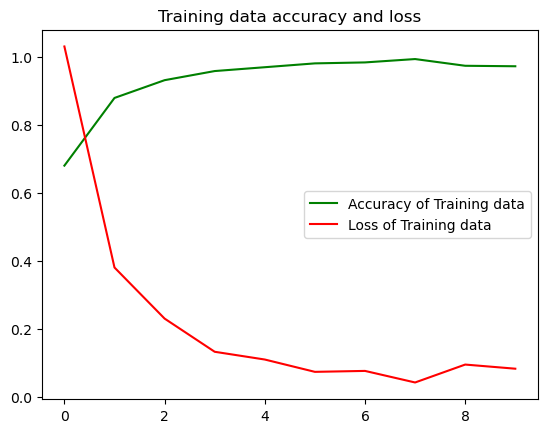

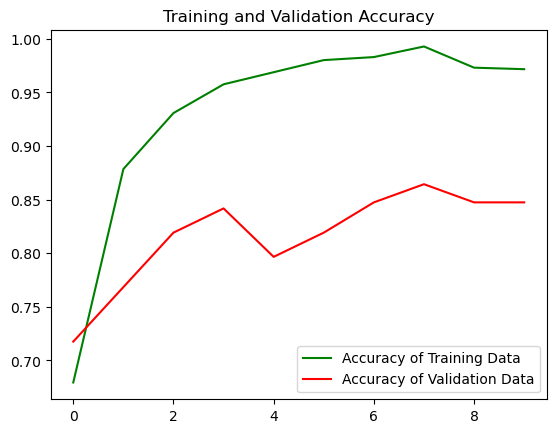

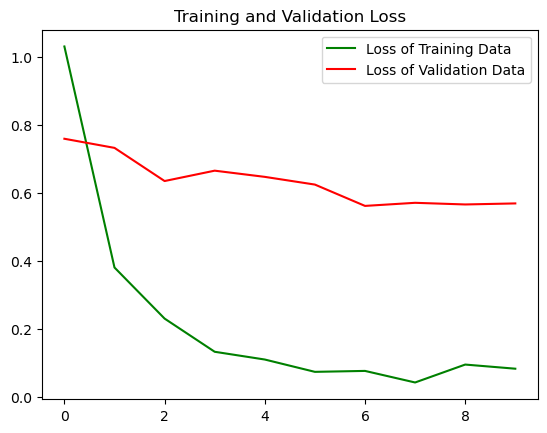

<Figure size 640x480 with 0 Axes>

In [20]:
get_ac = history.history['accuracy']
get_los = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(len(get_ac))
plt.plot(epochs, get_ac, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_ac, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_los, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.figure()
plt.show()

In [34]:
X_val,y_val,y_pred=[],[],[]
for images, labels in val_ds:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred
df

6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step


,Actual,Prediction
0,1,1
1,4,2
2,0,0
3,5,5
4,2,2
...,...,...
172,2,2
173,0,0
174,0,0
175,1,1


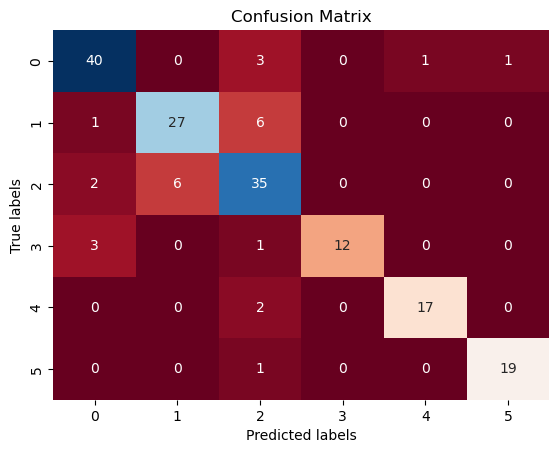

array([[40,  0,  3,  0,  1,  1],
       [ 1, 27,  6,  0,  0,  0],
       [ 2,  6, 35,  0,  0,  0],
       [ 3,  0,  1, 12,  0,  0],
       [ 0,  0,  2,  0, 17,  0],
       [ 0,  0,  1,  0,  0, 19]], dtype=int64)

In [38]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

<a id="12"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Evaluating Model Performance</span>

After training, we:
- Generate predictions on Validation images  
- Convert model outputs to class labels  

In [26]:
# 1. Train Accuracy (Last epoch accuracy from history)
train_acc = history.history['accuracy'][-1]
print(f"Training Accuracy: {train_acc * 100:.2f}%")

# 2. Validation Accuracy (Last epoch val_accuracy from history)
val_acc = history.history['val_accuracy'][-1]
print(f"Validation Accuracy: {val_acc * 100:.2f}%")


Training Accuracy: 97.18%
Validation Accuracy: 84.75%


6/6 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - accuracy: 0.8475 - loss: 0.5682
Accuracy: 84.74576473236084 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


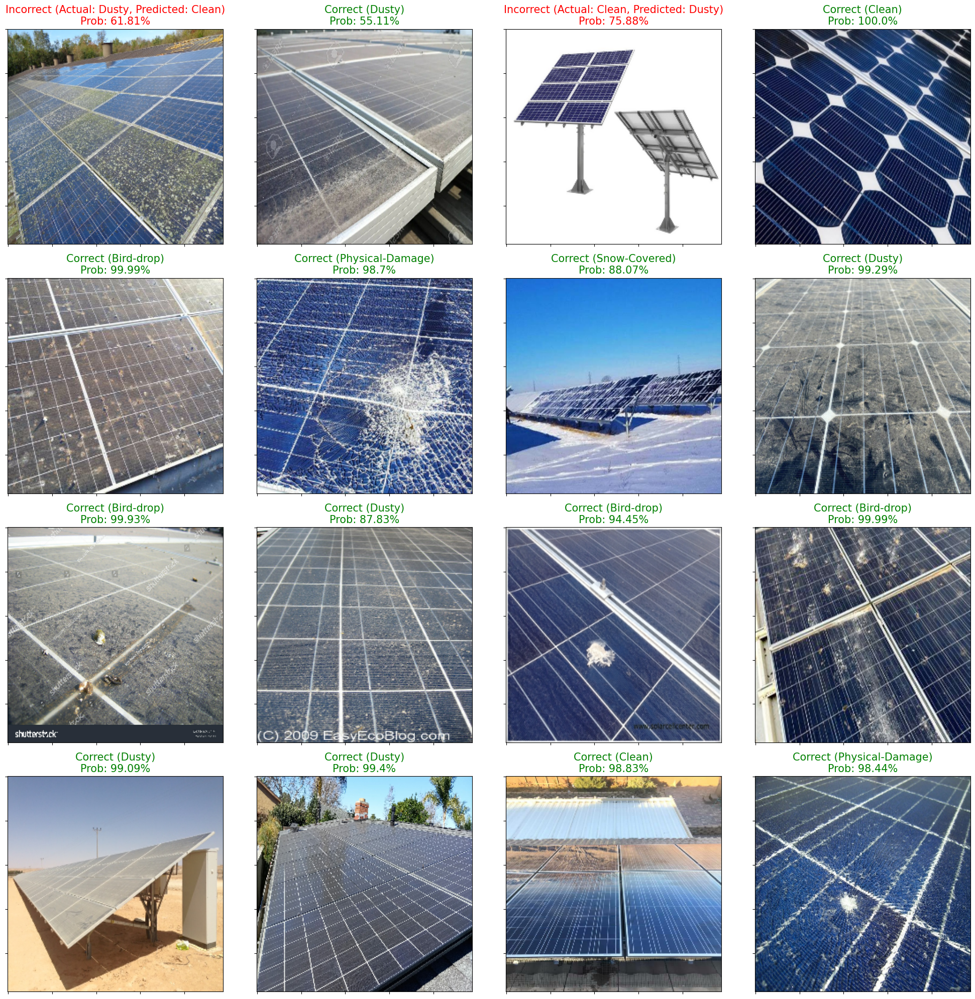

In [17]:
import matplotlib.pyplot as plt
import numpy as np
# Assuming you have already evaluated the model using model.evaluate(val_ds)
# and obtained the loss and accuracy values
loss, accuracy = model.evaluate(val_ds)  # Assuming you have this line
# Display accuracy percentage
print("Accuracy:", accuracy * 100, "%")  # Convert accuracy to percentage
# Get a batch of images and labels from the validation dataset
images, labels = next(iter(val_ds))  # This retrieves one batch
# Create a 4x4 grid of subplots
plt.figure(figsize=(20, 20))  # Adjust figure size as needed
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    # Display the image
    plt.imshow(images[i].numpy().astype("uint8"))
    # Make predictions on the current image
    predictions = model.predict(tf.expand_dims(images[i], 0))
    score = tf.nn.softmax(predictions[0])
    # Determine the predicted class index and label
    predicted_class_idx = np.argmax(score)
    predicted_class_label = class_names[predicted_class_idx]
    # Determine the actual class label
    actual_class_label = class_names[labels[i]]
    # Set title and labels with accuracy percentage
    if actual_class_label == predicted_class_label:
        color = 'green'
        accuracy_text = f"Correct ({actual_class_label})"
    else:
        color = 'red'
        accuracy_text = f"Incorrect (Actual: {actual_class_label}, Predicted: {predicted_class_label})"
    # Convert score to NumPy array for rounding
    score_np = score.numpy()  # Convert TensorFlow tensor to NumPy array
    predicted_prob = round(score_np[predicted_class_idx] * 100, 2)  # Round prediction probability

    plt.title(f"{accuracy_text}\nProb: {predicted_prob}%", color=color, fontsize=15)
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

<a id="13"></a> <br>
<span class="label label-default" style="border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Real-World Stress Test </span>

Tested on completely new images sourced from the internet, distinct from the training distribution

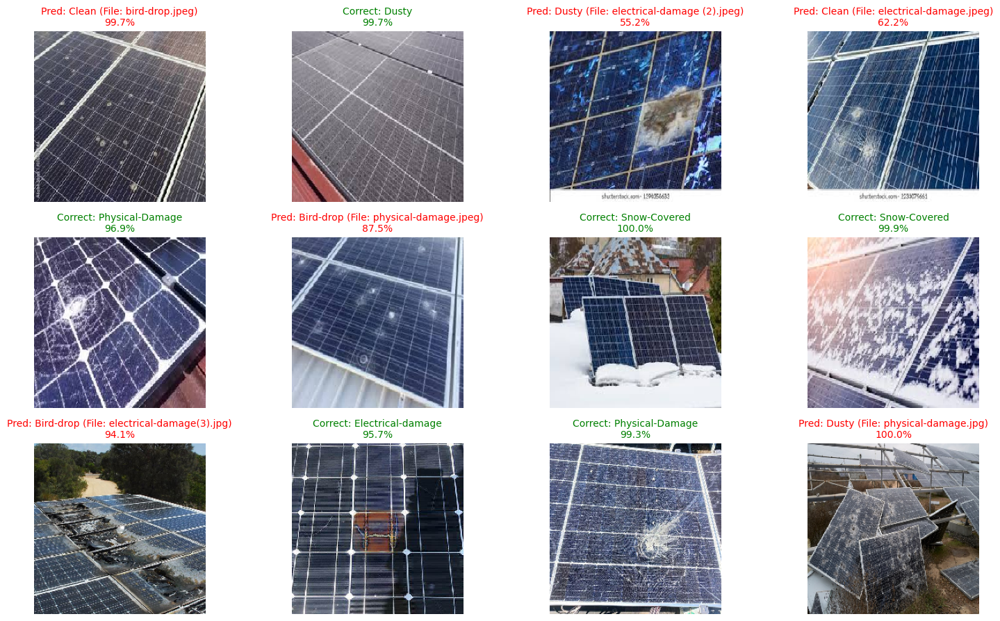

In [27]:
import tensorflow as tf
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

folder_path = 'c:/Users/omkar/Pictures/sample data'
image_files = glob.glob(os.path.join(folder_path, '*.jpeg')) + \
              glob.glob(os.path.join(folder_path, '*.jpg'))

correct_predictions = 0
total_images = 0

plt.figure(figsize=(15, 15))

for i, img_path in enumerate(image_files):
    if i >= 20: break
    
    # Load and Preprocess
    # Note: Use target_size=(224, 224) for VGG19, not 244
    img = image.load_img(img_path, target_size=(224, 224)) 
    img_array = image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    
    # Preprocess input (Crucial for VGG19 accuracy)
    img_array = tf.keras.applications.vgg19.preprocess_input(img_array)

    # Predict
    predictions = model.predict(img_array, verbose=0)
    
    # REMOVED tf.nn.softmax (Your model likely already has it)
    score =  tf.nn.softmax(predictions[0]) 
    
    predicted_class = class_names[np.argmax(score)]
    confidence = 100 * np.max(score)
    
    # --- ACCURACY CALCULATION LOGIC ---
    # Check if the predicted name is inside the filename
    # Example: If predicted 'Dusty' and filename is 'solar_dusty_01.jpg'
    filename = os.path.basename(img_path).lower()
    
    # We assume 'truth' is in the filename. 
    # If filename is just "image_01.jpg", this part will fail.
    if predicted_class.lower() in filename:
        correct_predictions += 1
        result_color = 'green'
        label_text = f"Correct: {predicted_class}"
    else:
        result_color = 'red'
        label_text = f"Pred: {predicted_class} (File: {filename})"
    
    total_images += 1
    # ----------------------------------

    # Display
    ax = plt.subplot(5, 4, i + 1)
    plt.imshow(image.load_img(img_path, target_size=(224, 224))) # Load again to show raw image
    plt.title(f"{label_text}\n{confidence:.1f}%", color=result_color, fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()